In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
#https://scipython.com/blog/quadtrees-2-implementation-in-python/
#https://pydoc.net/openslide-python/1.1.1/openslide/

import numpy as np
import openslide
from probreg import cpd
from probreg import transformation as tf
import cv2
from PIL import Image
from pathlib import Path
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

from sklearn.neighbors import LocalOutlierFactor

In [3]:
from registration_tree import Rect, QuadTree

In [29]:
df = pd.read_pickle("../../SDATA/Statistics/SDATA_Final_Annotations.pkl")
df = df[df["image_name"] == "24_EIPH_576255 Berliner Blau.svs"]

df["x1"] = [vector['x1'] if type(vector) is dict else 0 for vector in df["vector"]]
df["y1"] = [vector['y1'] if type(vector) is dict else 0 for vector in df["vector"]]

df["x2"] = [vector['x2'] if type(vector) is dict else 0 for vector in df["vector"]]
df["y2"] = [vector['y2'] if type(vector) is dict else 0 for vector in df["vector"]]

df["center_x"] = [x1 + ((x2-x1) / 2) for x1, x2 in zip(df["x1"], df["x2"])]
df["center_y"] = [y1 + ((y2-y1) / 2) for y1, y2 in zip(df["y1"], df["y2"])]

df["anno_width"] = [x2-x1 for x1, x2 in zip(df["x1"], df["x2"])]
df["anno_height"]= [y2-y1 for y1, y2 in zip(df["y1"], df["y2"])]

df = df.sort_values(by=["grade"], ascending=False)
df.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,user_id,deleted,...,data_set_name,version,x1,y1,x2,y2,center_x,center_y,anno_width,anno_height
unique_identifier,,,,,,,,,,,,,,,,,,,,,
0412b6f8-b13d-4517-ba6f-3e03525b423d,2530043,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 24346, 'x2': 24527, 'y1': 15610, 'y2': ...",1,False,...,SDATA,Density,24346,15610,24527,15793,24436.5,15701.5,181,183
8daed17b-dd34-42fe-aa38-75cb0a0c62c2,2529981,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 21320, 'x2': 21472, 'y1': 11489, 'y2': ...",1,False,...,SDATA,Density,21320,11489,21472,11642,21396.0,11565.5,152,153
bf582d83-dc00-4cb7-b74d-f78ce8d7c631,2530008,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 19562, 'x2': 19682, 'y1': 27214, 'y2': ...",1,False,...,SDATA,Density,19562,27214,19682,27334,19622.0,27274.0,120,120
8e891521-ed03-4637-bf24-0a5c7baf8094,2530002,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 15240, 'x2': 15331, 'y1': 7919, 'y2': 8...",1,False,...,SDATA,Density,15240,7919,15331,8010,15285.5,7964.5,91,91
2387348e-509d-4c59-86a6-2670a84a634e,2530000,5180,268,equine,24_EIPH_576255 Berliner Blau.svs,Prussian,4,"{'x1': 26904, 'x2': 27019, 'y1': 12569, 'y2': ...",1,False,...,SDATA,Density,26904,12569,27019,12684,26961.5,12626.5,115,115


In [30]:
annos = np.array(df[["center_x", "center_y", "anno_width", "anno_height"]])
annos[:5]

array([[24436.5, 15701.5,   181. ,   183. ],
       [21396. , 11565.5,   152. ,   153. ],
       [19622. , 27274. ,   120. ,   120. ],
       [15285.5,  7964.5,    91. ,    91. ],
       [26961.5, 12626.5,   115. ,   115. ]])

In [97]:
file_scanner = {
    "24_EIPH_576255 Berliner Blau.svs": {"Name": "Aperio", "slide": None, "thumbnail": None},
    "Z_BB_576255_1.tif": {"Name":"AxioScan", "slide": None, "thumbnail": None},
    "N2_BB_576255_1.ndpi": {"Name": "NanoZoomer2.0HT", "slide": None, "thumbnail": None},
    "N1_BB_576255_1.ndpi": {"Name": "NanoZoomerS210", "slide": None, "thumbnail": None},
}

source_slide = openslide.OpenSlide(f'../Slides/Aperio/24_EIPH_576255 Berliner Blau.svs')
target_slide = openslide.OpenSlide(f'../Slides/Aperio/24_EIPH_576255 Berliner Blau.svs')
#target_slide = openslide.OpenSlide(f'../Slides/NanoZoomer2.0HT/N2_BB_576255_1.ndpi')

source_dimension = Rect.create(Rect, 0, 0, source_slide.dimensions[0], source_slide.dimensions[1])
target_dimension = Rect.create(Rect, 0, 0, target_slide.dimensions[0], target_slide.dimensions[1])


In [134]:
%%time
qtree = QuadTree(source_dimension, source_slide, target_dimension, target_slide, target_depth=0, debug=True)
print(qtree)

Source: 24_EIPH_576255 Berliner Blau 
Target: 24_EIPH_576255 Berliner Blau 
Source: (0.00, 0.00, 34200.00, 32356.00) Target: (0.00, 0.00, 34200.00, 32356.00)
x: [1.000, -0.000, 0.000], y: [0.000, 1.000, 0.000]] q: -254.078
Wall time: 1.9 s


In [135]:
len(qtree.ptsA)

16

(<Figure size 1152x1152 with 16 Axes>, None)

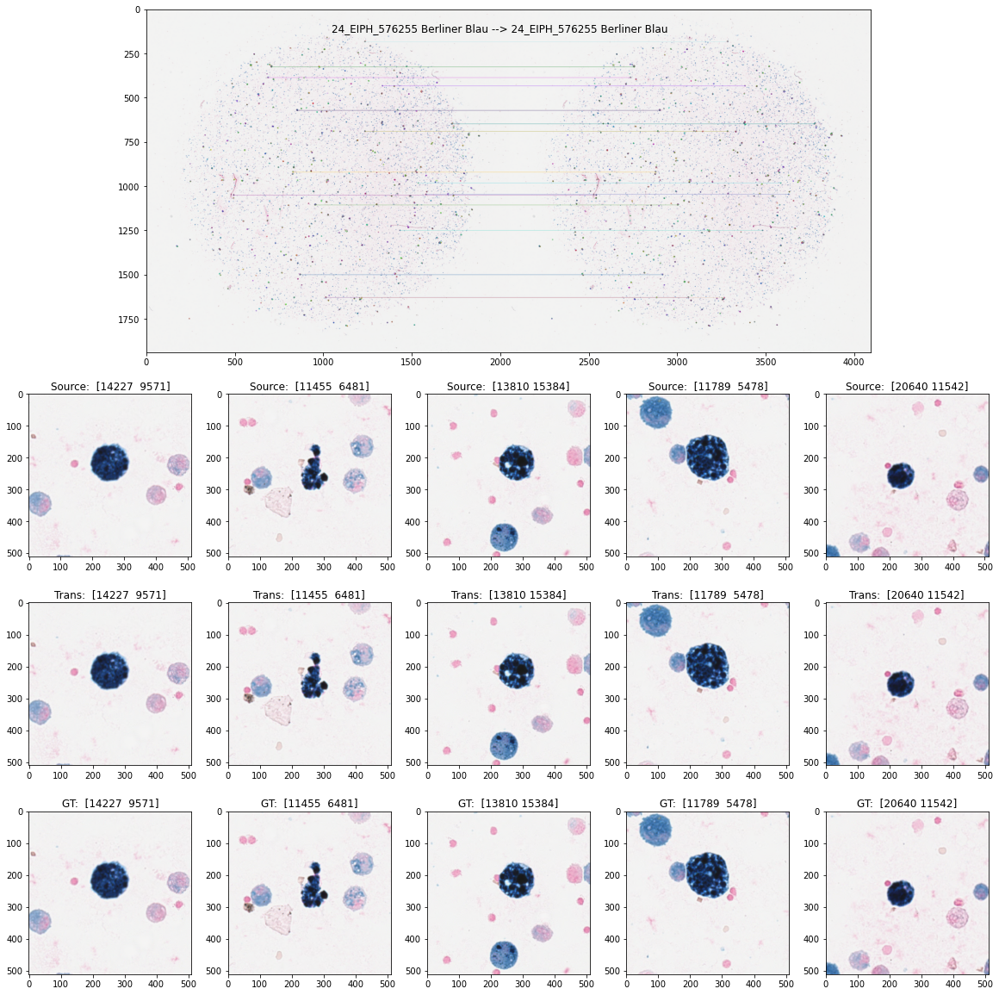

In [136]:
qtree.draw_feature_points() # num_sub_pic=2, figsize=(48, 48)

(<Figure size 1152x1152 with 11 Axes>, None)

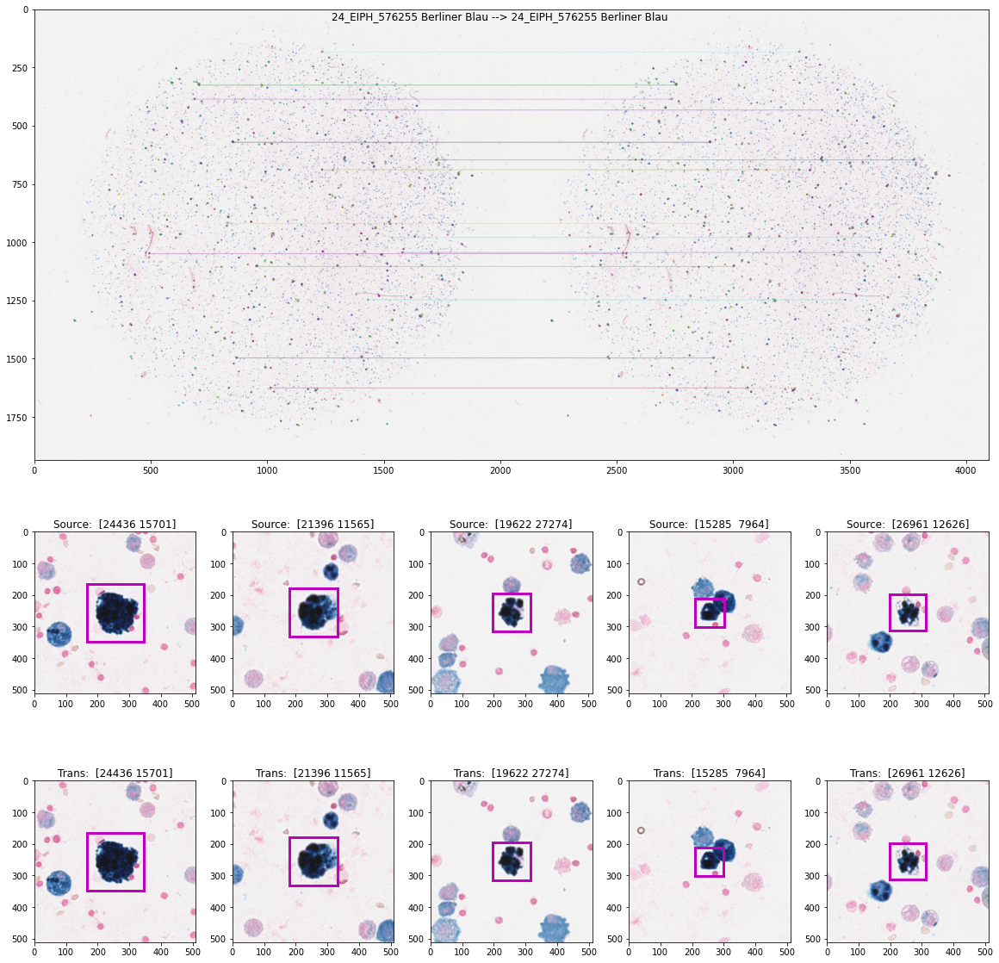

In [137]:
qtree.draw_annotations(annos)

In [138]:
%%time
qtree = QuadTree(source_dimension, source_slide, target_dimension, target_slide, target_depth=1)
print(qtree)

Source: 24_EIPH_576255 Berliner Blau 
Target: 24_EIPH_576255 Berliner Blau 
Source: (0.00, 0.00, 34200.00, 32356.00) Target: (0.00, 0.00, 34200.00, 32356.00)
x: [1.000, -0.000, 0.000], y: [0.000, 1.000, 0.000]] q: -254.078
nw: Source: (0.00, 0.00, 17100.00, 16178.00) Target: (0.00, -1.00, 17100.00, 16177.00)
  x: [1.000, -0.000, 0.000], y: [-0.000, 1.000, 0.000]] q: -255.078
ne: Source: (17100.00, 0.00, 34200.00, 16178.00) Target: (17100.00, -1.00, 34200.00, 16177.00)
  x: [1.000, 0.000, -0.000], y: [-0.000, 1.000, -0.000]] q: -255.078
se: Source: (17100.00, 16178.00, 34200.00, 32356.00) Target: (17100.00, 16177.00, 34200.00, 32355.00)
  x: [1.000, 0.000, -0.000], y: [-0.000, 1.000, 0.000]] q: -255.078
sw: Source: (0.00, 16178.00, 17100.00, 32356.00) Target: (0.00, 16177.00, 17100.00, 32355.00)
  x: [1.000, -0.000, -0.000], y: [-0.000, 1.000, 0.000]] q: -255.328
Wall time: 26.9 s


(<Figure size 1152x1152 with 11 Axes>,
 [(<Figure size 1152x1152 with 11 Axes>, None),
  (<Figure size 1152x1152 with 11 Axes>, None),
  (<Figure size 1152x1152 with 11 Axes>, None),
  (<Figure size 1152x1152 with 11 Axes>, None)])

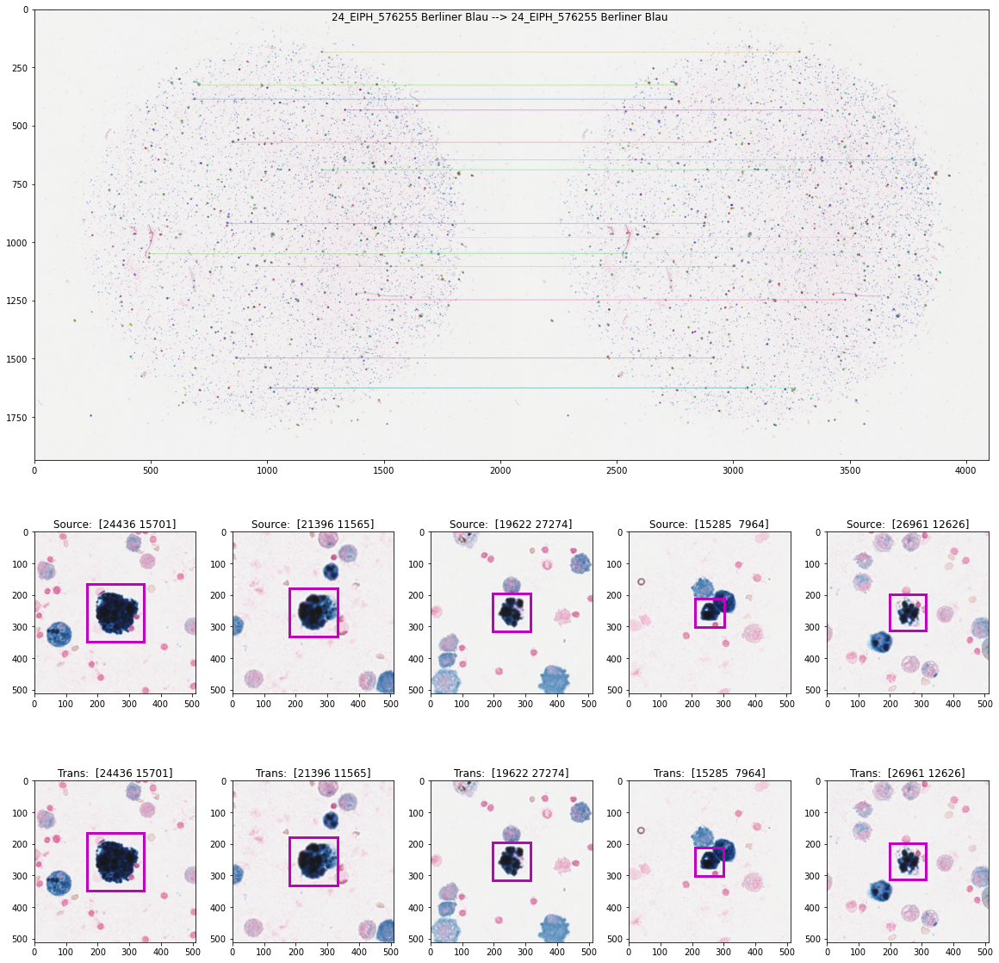

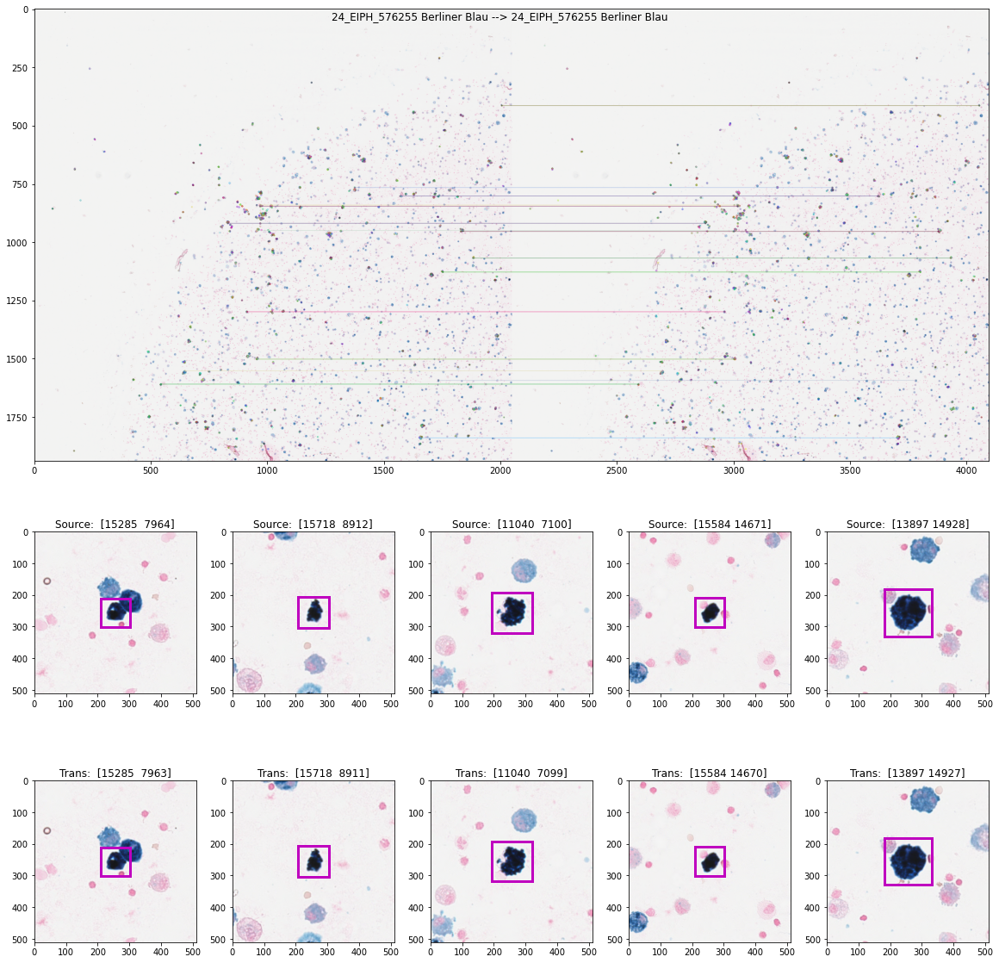

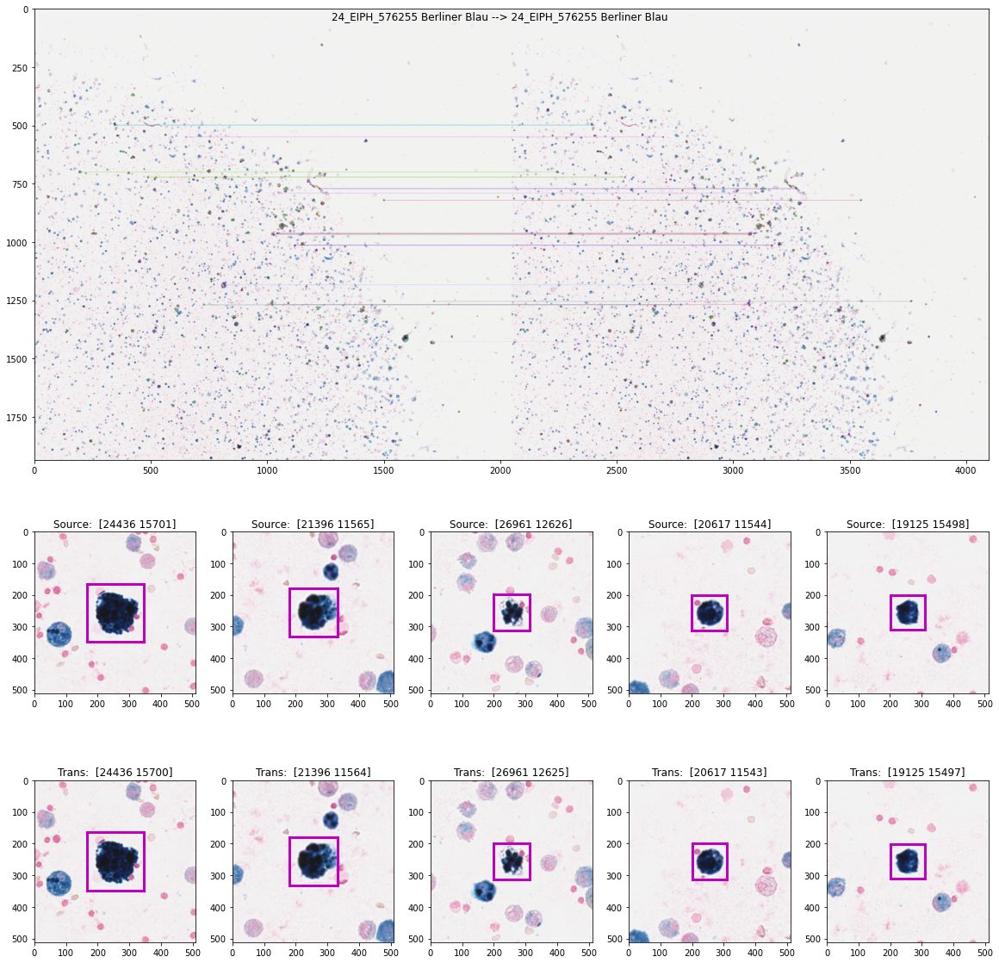

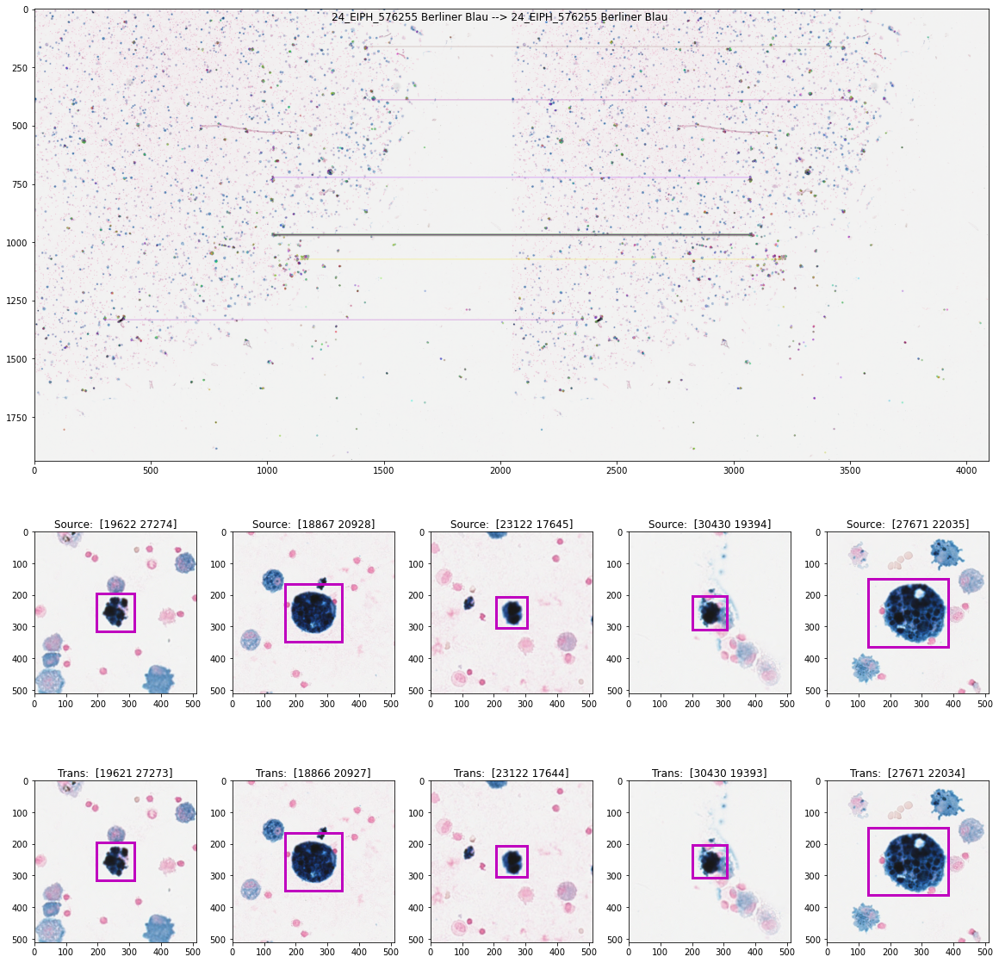

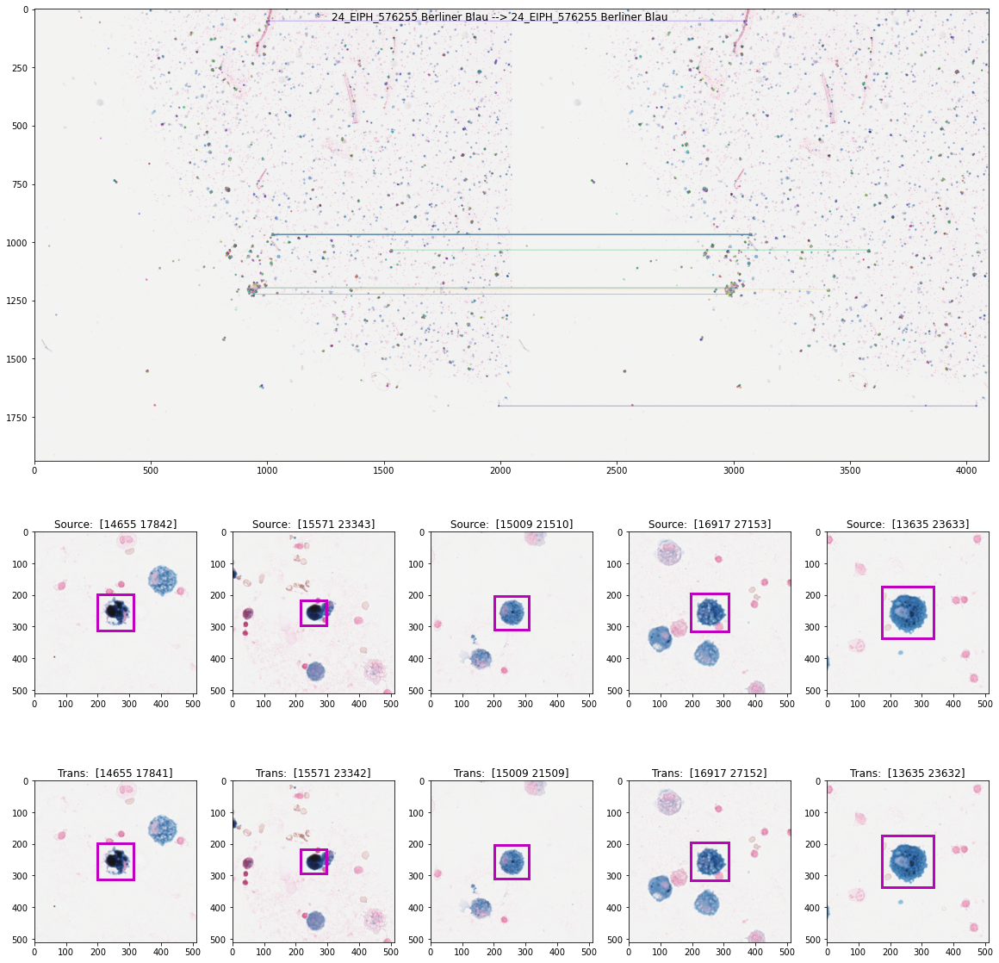

In [139]:
qtree.draw_annotations(annos)

(<Figure size 1152x1152 with 16 Axes>,
 [(<Figure size 1152x1152 with 16 Axes>, None),
  (<Figure size 1152x1152 with 16 Axes>, None),
  (<Figure size 1152x1152 with 16 Axes>, None),
  (<Figure size 1152x1152 with 16 Axes>, None)])

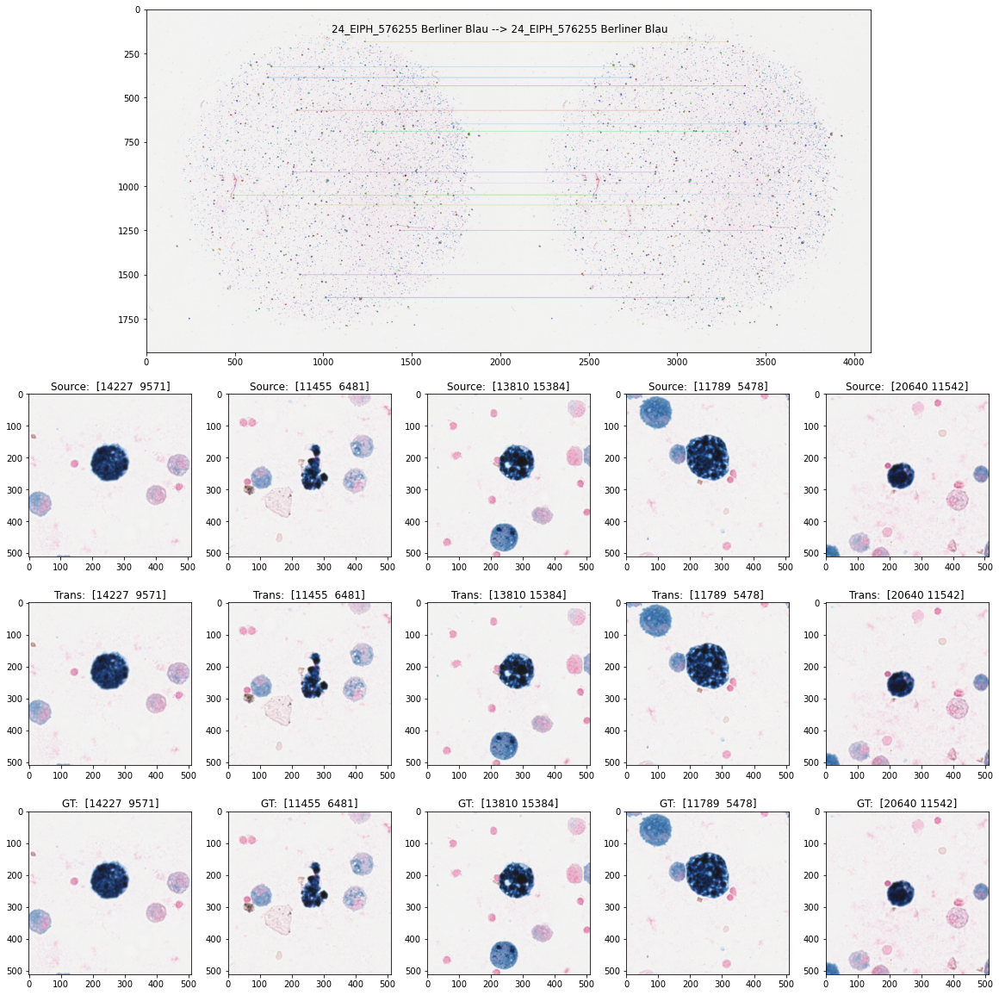

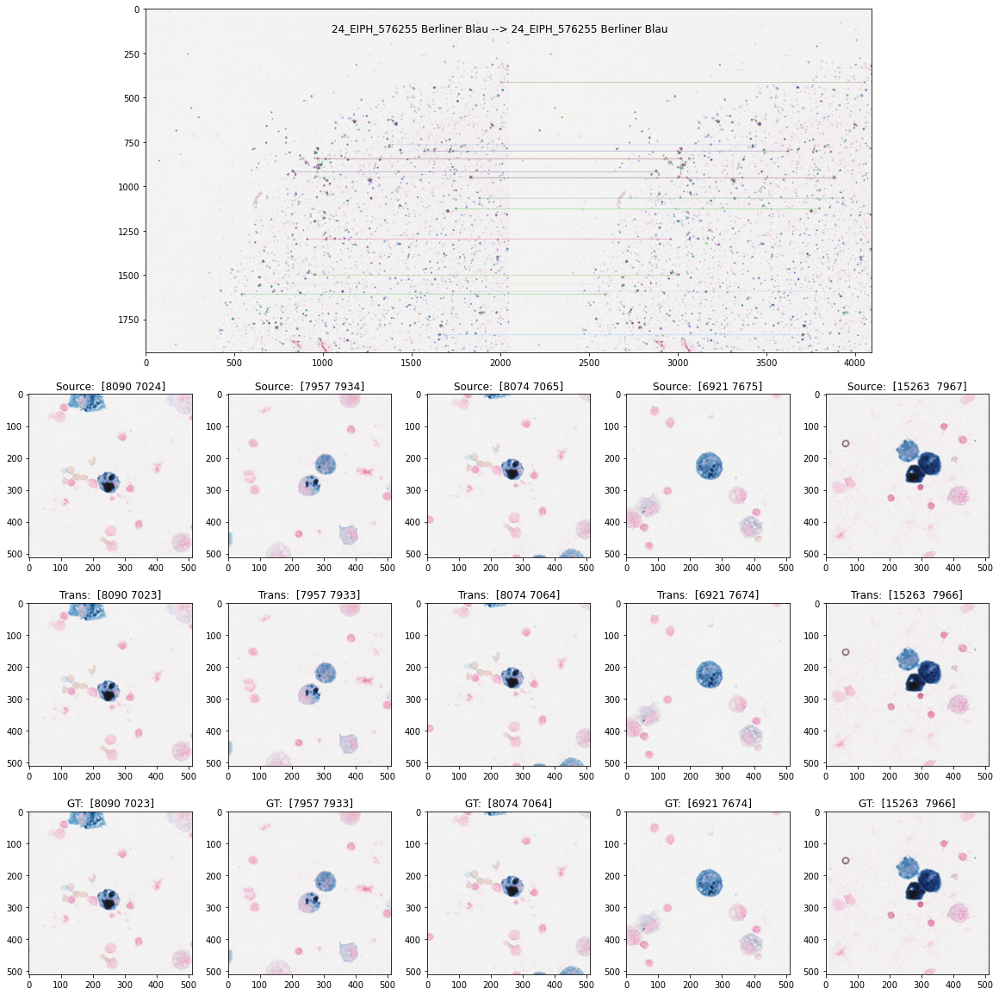

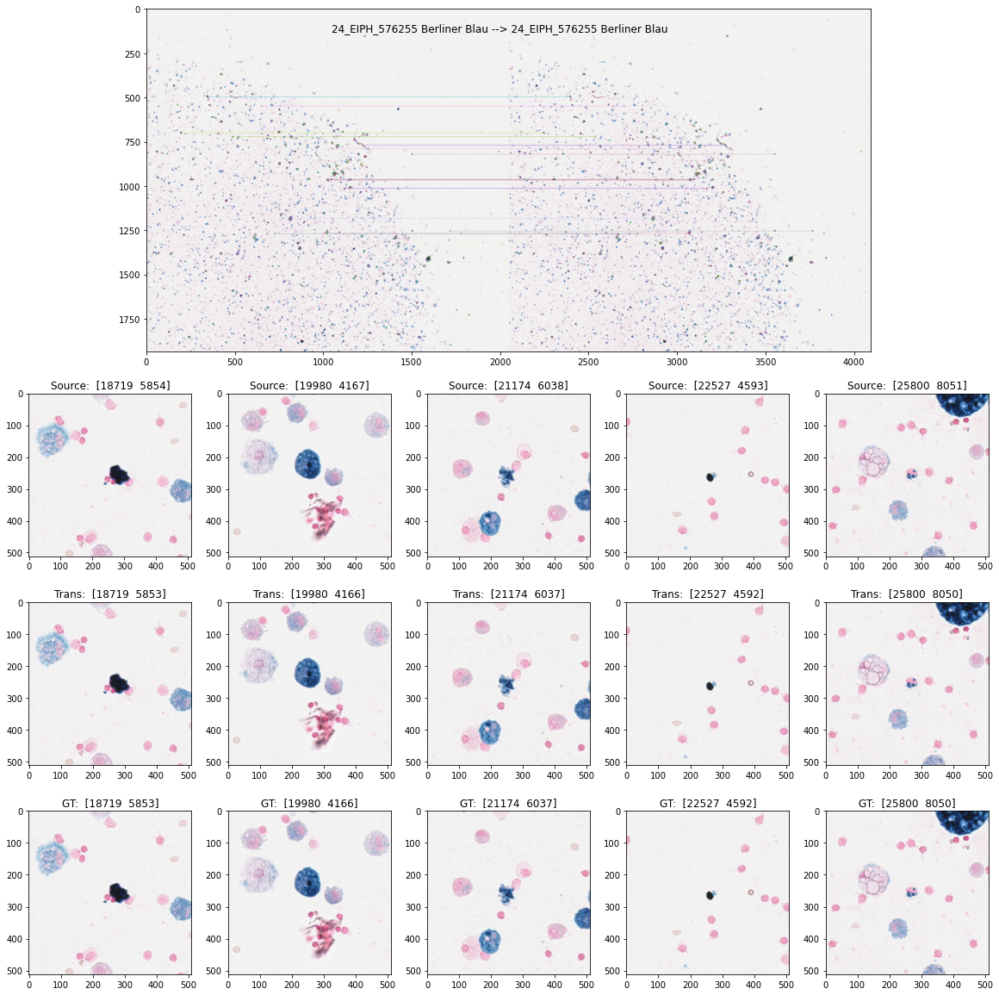

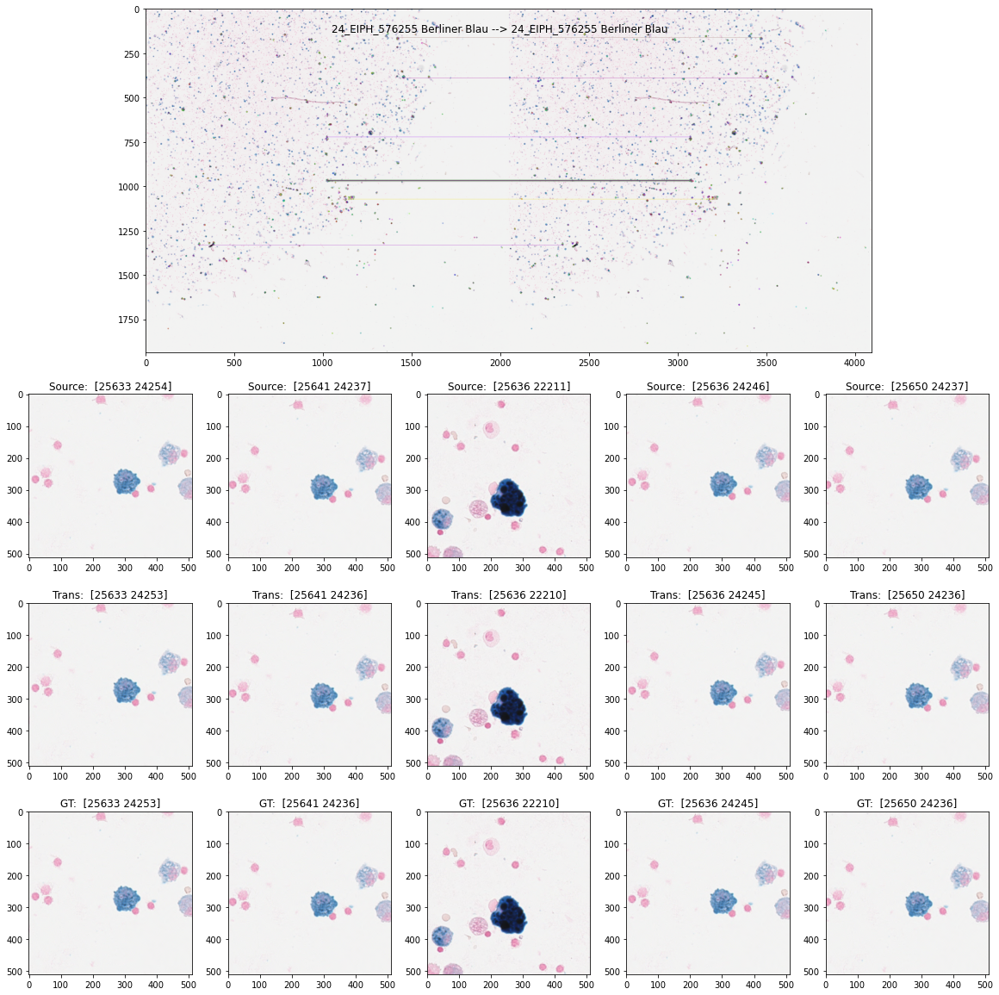

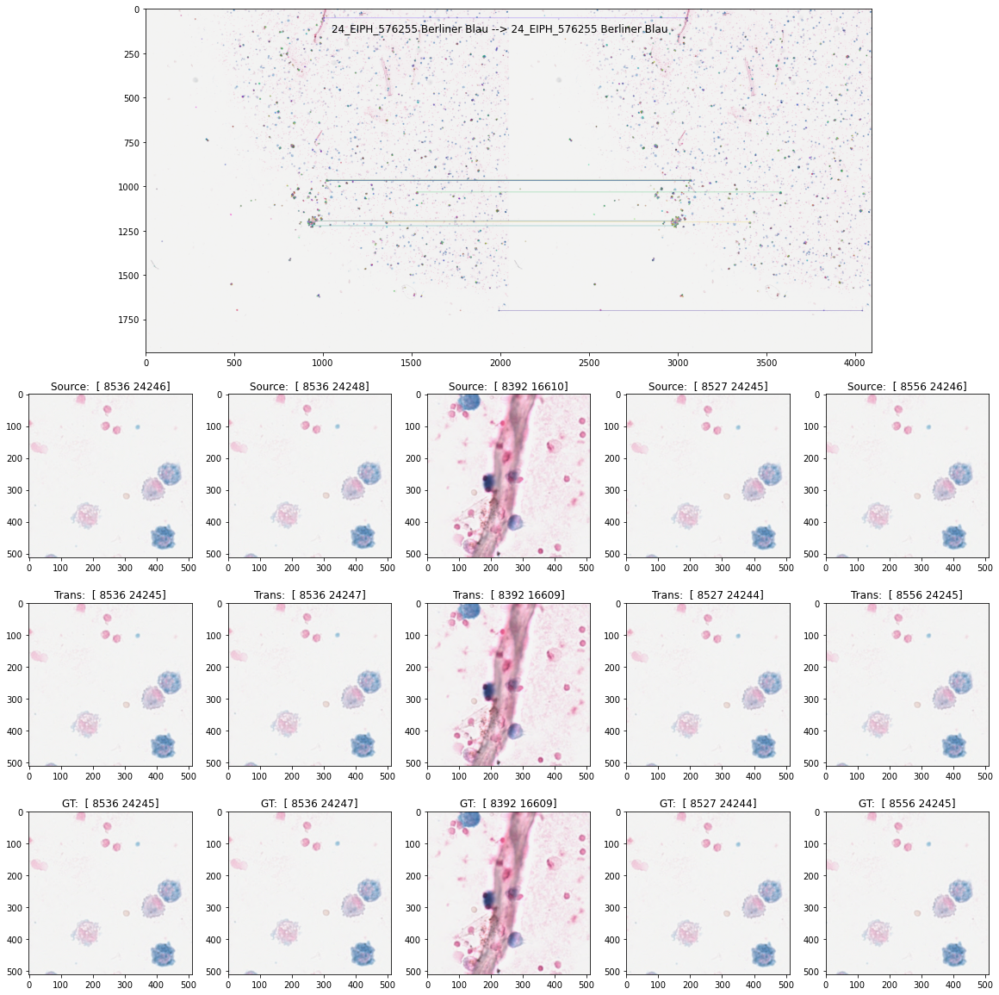

In [140]:
qtree.draw_feature_points()